# Flemming-Viot Simulations 
Itamar Fiorino

In [1]:
include("CTMC_methods.jl");
using LinearAlgebra
using Distributions
using Plots

rng = MersenneTwister(9090);

**Flemming Viot Scheme**

Simulation procedure:
- Initialize particles with random start states
- Initialize buffer
- Generate exponential variable (high precision) and select particle to be moved (buffer)
- Move particle, resampling if escaped
- Update buffer
  
Soft killing uses sum of exponentials (i.e. soft killing as a "state"). Inherits methods from CTMC_methods.jl

## Initialize particles

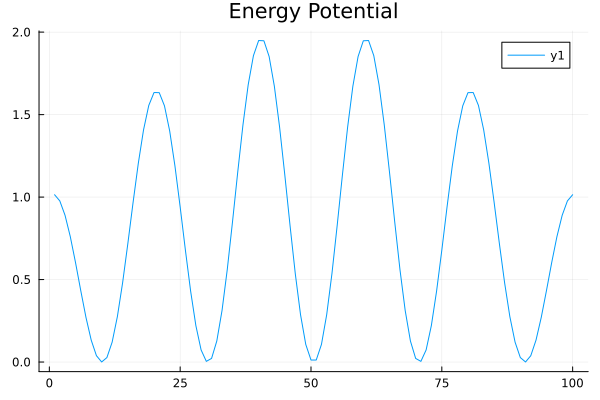

In [33]:
function distribution_from_occupation(occupation::Vector{<:Real})::Vector{Float64}
    p = 1/sum(occupation)
    return map(x -> p*x, occupation)
end

function soft_rand(p::Vector{Float64}, absorbing)
    r = rand()
    for i in setdiff(1:length(p), absorbing)
        r -= p[i]
        if r <= 0
            return i
        end
    end
    return i
end

function initialize(n, Q, absorbing, initial_distribution)::Tuple{Vector{UInt32}, Vector{Float64}}
    # Pre-allocate response using sizehint!
    n_states = size(Q)[1]
    # res = n ≤ 65535 ? Vector{UInt16} : Vector{UInt32}
    particles = Vector{UInt32}(rand(Multinomial(n, initial_distribution)))
    sizehint!(particles, n_states)
    weighted_particles = Vector{Float64}([(-Q[i, i] * particles[i]) for i in 1:n_states])
    return particles, weighted_particles
end

function evolve!(particles, weighted_particles, Q, absorbing, verbose = false)::Bool
    initial_distribution = distribution_from_occupation(weighted_particles)
    from = soft_rand(initial_distribution, absorbing)
    r = rand()
    to = state(from, Q, r)
    killed = false
    if to in absorbing
        to = soft_rand(distribution_from_occupation(particles), absorbing)
        killed = true
    end
    if verbose
        @printf "Particle %i moved to %i\n" from to
    end
    particles[from] -= 1
    particles[to] += 1
    weighted_particles[from] -= -Q[from, from]
    weighted_particles[to] += -Q[to, to]
    return killed
end

function evolve_update!(μ̄, particles, weighted_particles, Q, absorbing)::Bool
    initial_distribution = distribution_from_occupation(weighted_particles)
    from = soft_rand(initial_distribution, absorbing)
    r = rand()
    to = state(from, Q, r)
    killed = false
    if to in absorbing
        to = soft_rand(distribution_from_occupation(particles), absorbing)
        killed = true
    end
    μ̄ .+= particles .* (randexp() / sum(weighted_particles))
    particles[from] -= 1
    particles[to] += 1
    weighted_particles[from] -= -Q[from, from]
    weighted_particles[to] += -Q[to, to]
    return killed
end


### Transition Parameters
const n_states = 100
const start_n_particles = 100
# λ = 1
# μ = 1
# Q = birth_death(n_states, μ, λ)
function f(x)
    return - 4 * x * (x-1)
end
function g(x)
    return 1 - sin(5* π * x)^2
end
function J(x)
    return g(x/(n_states + 1)) * (1 + 1 * f(x / (n_states+1)))
end
J_vect = map(J, 1:n_states)
display(plot(1:n_states, J_vect, title="Energy Potential"))
# display(plot(1:n_states, map(x -> exp(-x), J_vect), title="Energy Potential"))
Q = rates_energy_potential(J_vect)
absorbing = [1, n_states]

initial_distribution = distribution_from_occupation([(i in absorbing ? 0 : 1) for i in 1:n_states])
particles, weighted_particles = initialize(start_n_particles, Q, absorbing, initial_distribution);

## Computing Perron-Frobenius Eigenvalues
The below code finds the stationary distribution for the original chain, and notices differences in the computed eigenvalues of $Q$ and $Q^T$.

L¹ Error in QSD: 1.5814795111500357e-11


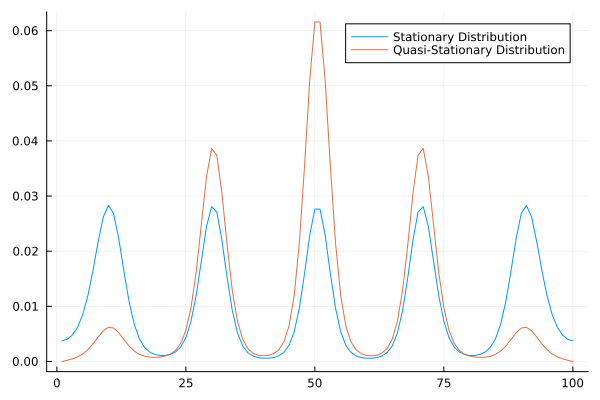

In [29]:
function diff(Q, v, λ)
    h = zeros(length(v))
    mul!(h, Q, v)
    return norm(h - λ * v)
end

allowed = setdiff(1:n_states, absorbing)
Q̄ = Q[allowed, allowed]
eigenvalues = eigvals(Q̄')
eigenvectors = eigvecs(Q̄')
pf_eig, pf_index = findmax(eigenvalues)
QSD = eigenvectors[: , pf_index]
QSD = QSD ./ norm(QSD, 1)
QQSD = (Q̄' * QSD) / pf_eig
@printf "L¹ Error in QSD: %s\n" norm(QSD - QQSD, 1)
QSD = [[0] ; QSD ; [0]]
eigenvalues = eigvals(Q')
eigenvectors = eigvecs(Q')
pf_eig, pf_index = findmax(eigenvalues)
SD = eigenvectors[: , pf_index]
SD = abs.(SD ./ norm(SD, 1))

p = plot(SD, lab = "Stationary Distribution")
display(plot!(p, QSD, lab = "Quasi-Stationary Distribution"))

Scaling on iteration 10000
Scaling on iteration 50000
Scaling on iteration 80000
 10.752757 seconds (9.48 M allocations: 1.002 GiB, 0.66% gc time, 0.42% compilation time)


[ Info: Saved animation to /Users/azul/Documents/Numerics/QSD/flemming-viot_burn-time.gif


Plots.AnimatedGif("/Users/azul/Documents/Numerics/QSD/flemming-viot_burn-time.gif")
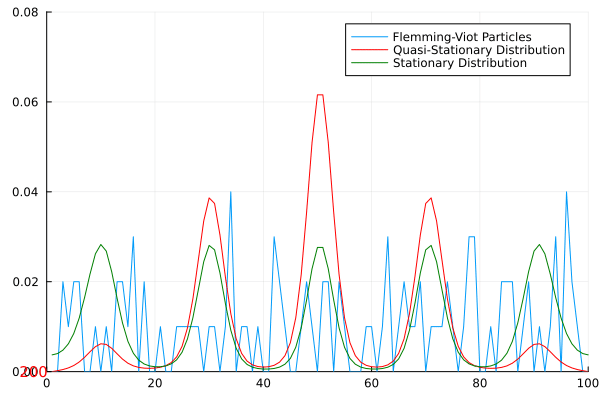

 13.576165 seconds (46.52 M allocations: 11.151 GiB, 3.29% gc time, 0.16% compilation time)


[ Info: Saved animation to /Users/azul/Documents/Numerics/QSD/flemming-viot.gif


Plots.AnimatedGif("/Users/azul/Documents/Numerics/QSD/flemming-viot.gif")
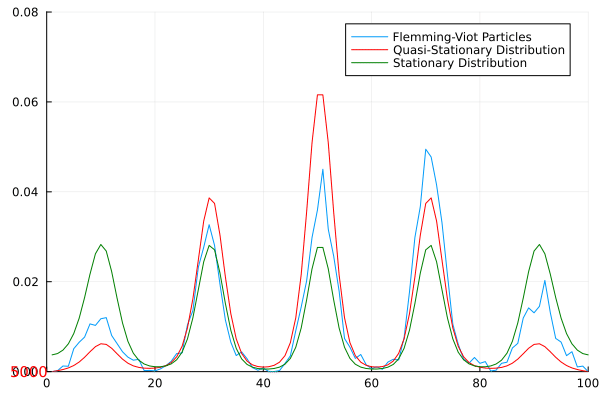

In [34]:
### Flemming-Viot Simluation
const n_iters_burn = 120000
doubling_schedule_burn = [10000, 50000, 80000]

a = Plots.Animation()
k = 2 * maximum(particles)
z = 0
@time for i in 1:n_iters_burn  
    if i%200 == 0
        plt = plot(particles./ start_n_particles ./ 2^z, ylim=(0, maximum(QSD) * 1.3), xlim=(0,n_states), lab="Flemming-Viot Particles")
        plot!(plt, QSD, color="red", lab = "Quasi-Stationary Distribution")
        plot!(plt, SD, color="green", lab = "Stationary Distribution")
        Plots.annotate!(0, 0, text(string(i), :red, :right, 10)) 
        frame(a, plt)
    end
    if i in doubling_schedule_burn
        println("Scaling on iteration ", i)
        particles = particles .* 2
        weighted_particles = weighted_particles .* 2
        k = k * 2
        z += 1
    end
    evolve!(particles, weighted_particles, Q, absorbing)
end

display(gif(a, "flemming-viot_burn-time.gif"))

const n_iters = 2000000

a = Plots.Animation()
k = 2 * maximum(particles)
z = 0
μ̄ = zeros(n_states)::Vector{Float64}
@time for i in 1:n_iters   
    if i%5000 == 0
        plt = plot(μ̄/sum(μ̄), ylim=(0, maximum(QSD) * 1.3), xlim=(0,n_states), lab="Flemming-Viot Particles")
        plot!(plt, QSD, color="red", lab = "Quasi-Stationary Distribution")
        plot!(plt, SD, color="green", lab = "Stationary Distribution")
        Plots.annotate!(0, 0, text(string(i), :red, :right, 10)) 
        frame(a, plt)
    end
    evolve_update!(μ̄, particles, weighted_particles, Q, absorbing)
end

gif(a, "flemming-viot.gif")